# Classification – Rain in Australia

## Project Goal
Build a binary classification model to predict whether it will rain tomorrow in Australia, based on historical weather data collected from multiple meteorological stations.

## Main Challenges
- Handling a large number of categorical variables (e.g., wind directions and locations).
- Properly dealing with many missing values (`NaN`) using appropriate imputation techniques.
- Processing and utilizing date-related features correctly.

## Evaluation Metric
Models will be evaluated using:
- **ROC-AUC**
- **F1-Score**

## Submission File
Submit a CSV file containing the following columns:

| ID | RainTomorrow |
|----|--------------|
| Unique record identifier | Predicted value (`0` or `1`) |

Where:
- `0` = No rain tomorrow
- `1` = Rain tomorrow

In [1]:
import warnings
warnings.filterwarnings("ignore")

from pathlib import Path
import numpy as np
import pandas as pd
import joblib
import json

import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import seaborn as sns
from windrose import WindroseAxes

from sklearn.preprocessing import FunctionTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.model_selection import train_test_split, StratifiedKFold, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, HistGradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.inspection import permutation_importance
from sklearn.metrics import (
                            accuracy_score, 
                            balanced_accuracy_score,
                            precision_score, 
                            recall_score, 
                            f1_score, 
                            roc_auc_score, 
                            average_precision_score,
                            confusion_matrix,
                            ConfusionMatrixDisplay,
                            RocCurveDisplay,
                            PrecisionRecallDisplay,
                            classification_report
                            )

from xgboost import XGBClassifier

plt.style.use('bmh')

RANDOM_STATE = 42
np.random.seed(RANDOM_STATE)

DATA_DIR = Path("data")
MODEL_DIR = Path("models")
OUTPUT_DIR = Path("outputs")

DATA_DIR.mkdir(exist_ok=True)
MODEL_DIR.mkdir(exist_ok=True)
OUTPUT_DIR.mkdir(exist_ok=True)

In [2]:
train_path = DATA_DIR / "train_data.csv"
test_path = DATA_DIR / "test_features.csv"

train_df = pd.read_csv(train_path)
test_df = pd.read_csv(test_path)

print("Train shape:", train_df.shape)
print("Test shape:", test_df.shape)

display(train_df.head())
display(test_df.head())

target_col = 'RainTomorrow'

Train shape: (116368, 24)
Test shape: (29092, 23)


,ID,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,111549,2017-04-24,Albany,14.5,17.8,14.2,NaN,NaN,NaN,NaN,...,94.0,NaN,1024.1,1022.5,8.0,NaN,16.2,NaN,Yes,Yes
1,142529,2013-10-11,Katherine,24.6,39.5,0.0,12.0,NaN,SE,31.0,...,52.0,21.0,1011.8,1006.6,2.0,4.0,30.1,39.2,No,No
2,65305,2012-02-18,MelbourneAirport,14.7,26.6,0.2,3.2,8.0,SSE,30.0,...,87.0,57.0,1018.2,1015.4,7.0,3.0,17.3,24.5,No,No
3,40652,2012-02-18,Williamtown,18.3,26.6,0.0,NaN,NaN,SE,28.0,...,79.0,67.0,1017.0,1016.5,6.0,NaN,23.0,25.4,No,No
4,97488,2011-10-11,Adelaide,11.4,19.3,0.6,2.4,8.9,W,31.0,...,63.0,47.0,1018.6,1017.1,NaN,NaN,14.4,18.3,No,No


,ID,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,...,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday
0,100722,2012-04-22,MountGambier,15.0,18.9,4.2,6.6,8.0,NNW,54.0,...,31.0,73.0,64.0,1005.2,1003.7,4.0,5.0,17.3,17.6,Yes
1,30235,2008-03-30,Sydney,13.1,26.8,0.0,4.6,10.9,NaN,NaN,...,15.0,61.0,22.0,1013.0,1009.0,0.0,1.0,16.9,25.9,No
2,68428,2011-12-10,Melbourne,19.0,29.0,NaN,11.0,5.6,N,59.0,...,22.0,50.0,38.0,1006.5,1003.4,NaN,NaN,24.2,27.2,NaN
3,28625,2013-03-27,Richmond,18.1,32.2,0.0,2.1,NaN,NE,30.0,...,17.0,99.0,51.0,1019.2,1014.6,NaN,NaN,20.9,31.6,No
4,31174,2010-10-25,Sydney,13.9,19.6,14.0,1.2,5.4,SSW,50.0,...,22.0,90.0,64.0,NaN,1018.4,7.0,6.0,15.5,19.1,Yes


In [3]:
train_df = train_df.dropna(subset=[target_col]).copy()
train_df[target_col] = train_df[target_col].map({"No": 0, "Yes": 1}).astype("int8")
display(train_df.head())

,ID,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,111549,2017-04-24,Albany,14.5,17.8,14.2,NaN,NaN,NaN,NaN,...,94.0,NaN,1024.1,1022.5,8.0,NaN,16.2,NaN,Yes,1
1,142529,2013-10-11,Katherine,24.6,39.5,0.0,12.0,NaN,SE,31.0,...,52.0,21.0,1011.8,1006.6,2.0,4.0,30.1,39.2,No,0
2,65305,2012-02-18,MelbourneAirport,14.7,26.6,0.2,3.2,8.0,SSE,30.0,...,87.0,57.0,1018.2,1015.4,7.0,3.0,17.3,24.5,No,0
3,40652,2012-02-18,Williamtown,18.3,26.6,0.0,NaN,NaN,SE,28.0,...,79.0,67.0,1017.0,1016.5,6.0,NaN,23.0,25.4,No,0
4,97488,2011-10-11,Adelaide,11.4,19.3,0.6,2.4,8.9,W,31.0,...,63.0,47.0,1018.6,1017.1,NaN,NaN,14.4,18.3,No,0


In [4]:
train_cols = train_df.columns.tolist()
test_cols = test_df.columns.tolist()

if list(filter(lambda x: x not in test_cols, train_cols))[0] == target_col:
    print("The characteristics of the training and test datasets features are match.")
else: print("The training and test data set features do not match")

print("\nTrain columns:")
print(train_cols)

print("\nTest columns:")
print(test_cols)

print("\nTrain dtypes:")
display(train_df.dtypes)

print("\nTest dtypes:")
display(test_df.dtypes)


The characteristics of the training and test datasets features are match.

Train columns:
['ID', 'Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm', 'RainToday', 'RainTomorrow']

Test columns:
['ID', 'Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm', 'RainToday']

Train dtypes:


ID                 int64
Date                 str
Location             str
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir          str
WindGustSpeed    float64
WindDir9am           str
WindDir3pm           str
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday            str
RainTomorrow        int8
dtype: object


Test dtypes:


ID                 int64
Date                 str
Location             str
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir          str
WindGustSpeed    float64
WindDir9am           str
WindDir3pm           str
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday            str
dtype: object

In [5]:
print("Duplicates in train: ", train_df.duplicated().sum())

print("Duplicates in test: ", test_df.duplicated().sum())


Duplicates in train:  0
Duplicates in test:  0


In [6]:
print("Missing values in train:")
display(train_df.isna().mean().sort_values(ascending=False).to_frame("missing_ratio"))

print("Missing values in test:")
display(test_df.isna().mean().sort_values(ascending=False).to_frame("missing_ratio"))

Missing values in train:


,missing_ratio
Sunshine,0.477545
Evaporation,0.428802
Cloud3pm,0.402124
Cloud9am,0.377915
Pressure9am,0.098830
Pressure3pm,0.098698
WindDir9am,0.070261
WindGustDir,0.065787
WindGustSpeed,0.065391
WindDir3pm,0.026855


Missing values in test:


,missing_ratio
Sunshine,0.477554
Evaporation,0.428331
Cloud3pm,0.405954
Cloud9am,0.382614
Pressure9am,0.103259
Pressure3pm,0.102640
WindDir9am,0.073457
WindGustDir,0.071360
WindGustSpeed,0.070844
Humidity3pm,0.030627


,count,ratio
RainTomorrow,,
0,88304,0.776224
1,25457,0.223776


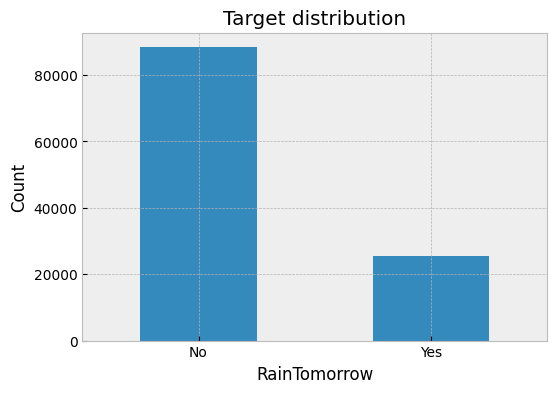

Majority-class baseline predicts always '0'
Majority-class accuracy: 0.776


In [7]:
class_counts = train_df[target_col].value_counts().sort_index()
class_ratios = train_df[target_col].value_counts(normalize=True).sort_index()

display(pd.DataFrame({
    "count": class_counts,
    "ratio": class_ratios
}))

plt.figure(figsize=(6, 4))
class_counts.plot(kind="bar")
plt.title("Target distribution")
plt.xlabel(target_col)
plt.xticks([0, 1], ["No", "Yes"])
plt.ylabel("Count")
plt.xticks(rotation=0)
plt.show()

majority_class = class_counts.idxmax()
majority_accuracy = class_ratios.max()
print(f"Majority-class baseline predicts always '{majority_class}'")
print(f"Majority-class accuracy: {majority_accuracy:.3f}")

del class_counts, class_ratios

## Exploratory Data Analysis - numerical features

In [8]:
numerical_cols_raw = train_df.drop(columns = ['ID', target_col]).select_dtypes(include = ['number']).columns.to_list()

display(train_df[numerical_cols_raw].describe().T)

,count,mean,std,min,25%,50%,75%,max
MinTemp,113251.0,12.186825,6.405993,-8.5,7.6,12.0,16.8,31.9
MaxTemp,113500.0,23.223778,7.117609,-4.8,17.9,22.6,28.2,47.3
Rainfall,112645.0,2.368047,8.530543,0.0,0.0,0.0,0.8,371.0
Evaporation,64980.0,5.466410,4.190790,0.0,2.6,4.8,7.4,145.0
Sunshine,59435.0,7.626521,3.781139,0.0,4.9,8.5,10.7,14.5
WindGustSpeed,106322.0,39.981415,13.612078,6.0,31.0,39.0,48.0,135.0
WindSpeed9am,112678.0,14.007783,8.894731,0.0,7.0,13.0,19.0,130.0
WindSpeed3pm,111632.0,18.635920,8.812021,0.0,13.0,19.0,24.0,87.0
Humidity9am,112333.0,68.870670,19.037856,0.0,57.0,70.0,83.0,100.0
Humidity3pm,110841.0,51.489972,20.785575,0.0,37.0,52.0,66.0,100.0


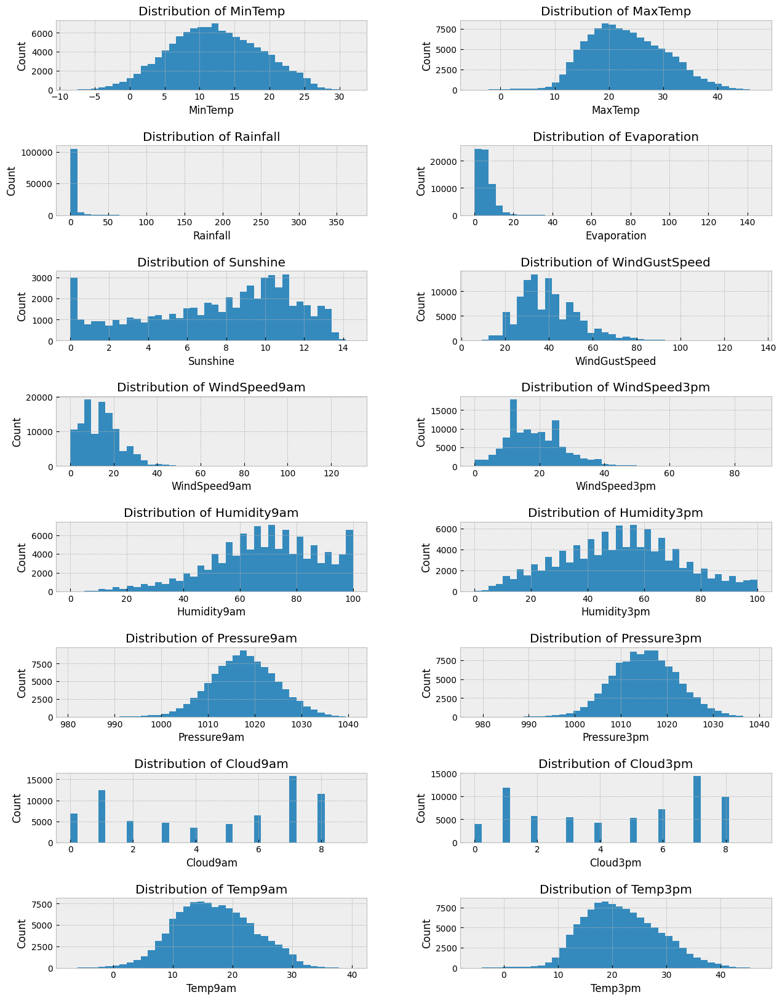

In [9]:
subplots_n_col = 2
subplots_n_rows = np.ceil(len(numerical_cols_raw)/subplots_n_col).astype('int8')

fig, ax = plt.subplots(subplots_n_rows, subplots_n_col, figsize = (15, 20))
fig.subplots_adjust(wspace=0.3, hspace=0.8) 
ax = ax.flatten()

for i, col in enumerate(numerical_cols_raw):
    train_df[col].hist(bins=40, ax = ax[i])
    ax[i].set_title(f"Distribution of {col}")
    ax[i].set_xlabel(col)
    ax[i].set_ylabel("Count")

plt.show()

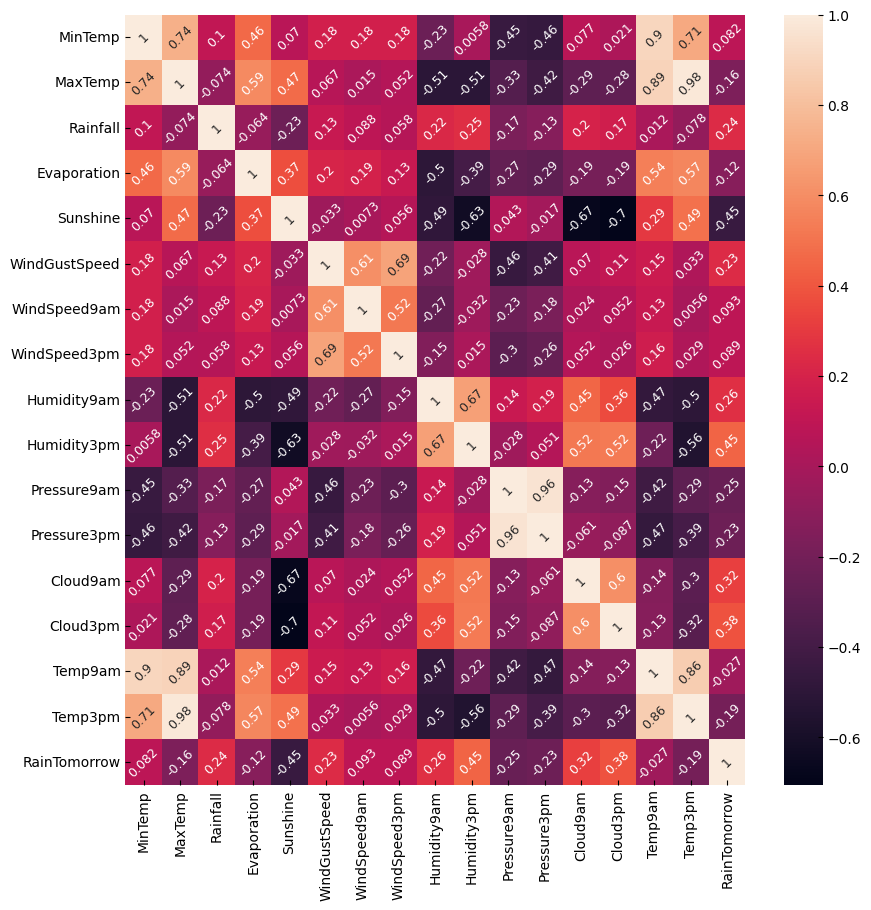

In [10]:
pair_cols = numerical_cols_raw.copy()
pair_cols.append(target_col)
pair_data = train_df[pair_cols]

plt.figure(figsize = (10, 10))
sns.heatmap(pair_data.corr(), annot=True, annot_kws={"size": 9, 'rotation': 45})
plt.grid(False)

## Pairplot for quick multivariate EDA

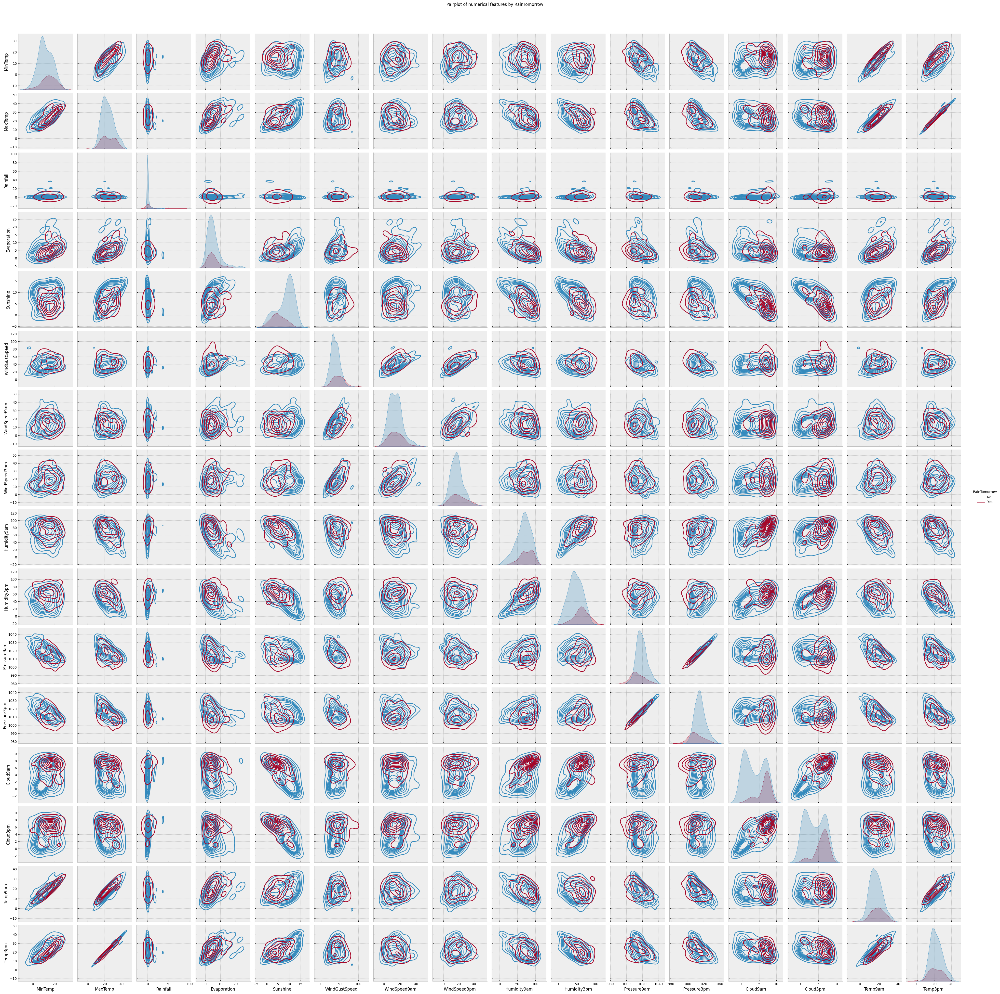

In [11]:
pairplot_sample_size = 250

pairplot_df, _ = train_test_split(
    pair_data,
    train_size=pairplot_sample_size,
    random_state=RANDOM_STATE,
    stratify=pair_data[target_col]
)

pairplot_df[target_col] = pairplot_df[target_col].replace({1:'Yes', 0:'No'})

sns.pairplot(
    pairplot_df,
    vars = numerical_cols_raw,
    hue = target_col,
    kind = "kde",
    hue_order=["No", "Yes"]
)

plt.suptitle(f"Pairplot of numerical features by {target_col}", y=1.02)
plt.show()

## Exploratory Data Analysis - categorical features

In [12]:
categorical_cols_raw = train_df.drop(columns = ['Date', 'RainTomorrow']).select_dtypes(include = ["object", "string"]).columns.to_list()
categorical_cols_raw


for col in categorical_cols_raw:
    print(f"\n{col}")
    print("Unique values:", train_df[col].nunique(dropna=True))
    display(train_df[col].value_counts(dropna=False).head(15).to_frame("count"))


Location
Unique values: 49


,count
Location,
Canberra,2763
Sydney,2616
Hobart,2569
Brisbane,2566
Darwin,2559
Perth,2530
Adelaide,2475
MountGambier,2443
Albany,2437



WindGustDir
Unique values: 16


,count
WindGustDir,
W,7870
NaN,7484
SE,7455
E,7261
N,7219
S,7186
SSE,7177
WSW,7113
SW,7052



WindDir9am
Unique values: 16


,count
WindDir9am,
N,9148
NaN,7993
SE,7394
E,7239
SSE,7167
NW,6803
S,6775
W,6647
SW,6569



WindDir3pm
Unique values: 16


,count
WindDir3pm,
SE,8545
W,7917
S,7688
WSW,7466
SW,7366
SSE,7354
WNW,6941
N,6919
NW,6813



RainToday
Unique values: 2


,count
RainToday,
No,87499
Yes,25146
NaN,1116


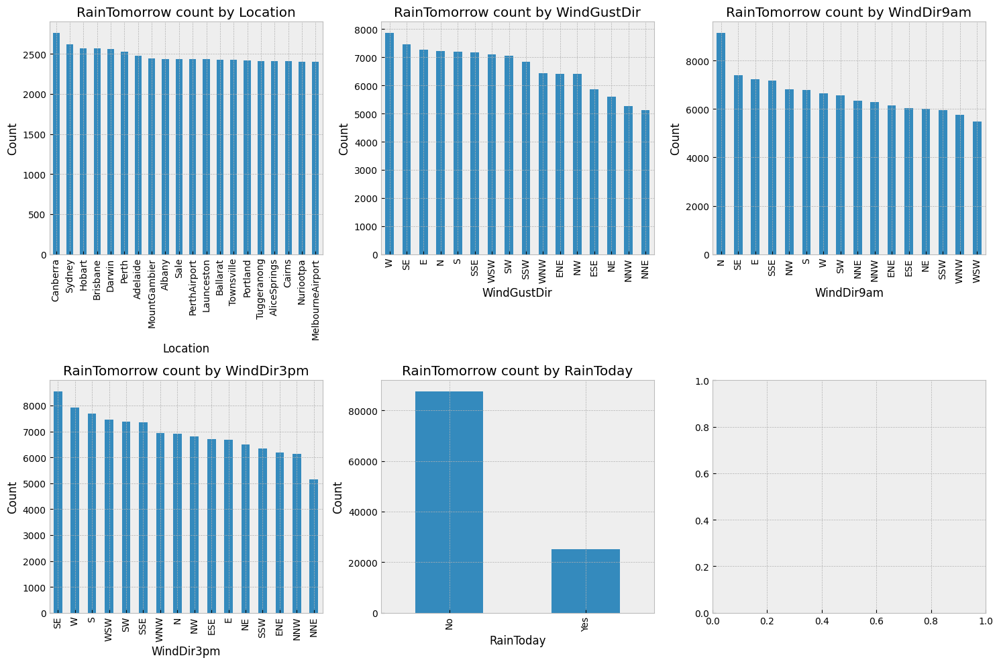

In [13]:
subplots_n_col = 3
subplots_n_rows = np.ceil(len(categorical_cols_raw)/subplots_n_col).astype('int8')

fig, ax = plt.subplots(subplots_n_rows, subplots_n_col, figsize = (15, 10))
fig.subplots_adjust(wspace=0.3, hspace=0.8) 
ax = ax.flatten()

for i, col in enumerate(categorical_cols_raw):

    plot_df = train_df.groupby(col)[target_col].count().sort_values(ascending=False).head(20)

    plot_df.plot(kind="bar", ax=ax[i])

    ax[i].set_title(f"{target_col} count by {col}")
    ax[i].set_ylabel("Count")
    ax[i].set_xlabel(col)
    ax[i].tick_params(axis="x", rotation=90)
    
plt.tight_layout()
plt.show()

In [14]:
directions = [
    "N", "NNE", "NE", "ENE",
    "E", "ESE", "SE", "SSE",
    "S", "SSW", "SW", "WSW",
    "W", "WNW", "NW", "NNW"
]

direction_to_rad = {d: i * np.pi / 8 for i, d in enumerate(directions)}

In [15]:
dir_pair_data = train_df[['WindGustDir', 'WindDir9am', 'WindDir3pm', target_col]].copy()
dir_pair_data[['WindGustDir', 'WindDir9am', 'WindDir3pm']] = dir_pair_data[['WindGustDir', 'WindDir9am', 'WindDir3pm']].replace(direction_to_rad).astype(float)
dir_pair_data = pd.get_dummies(dir_pair_data, drop_first=True)

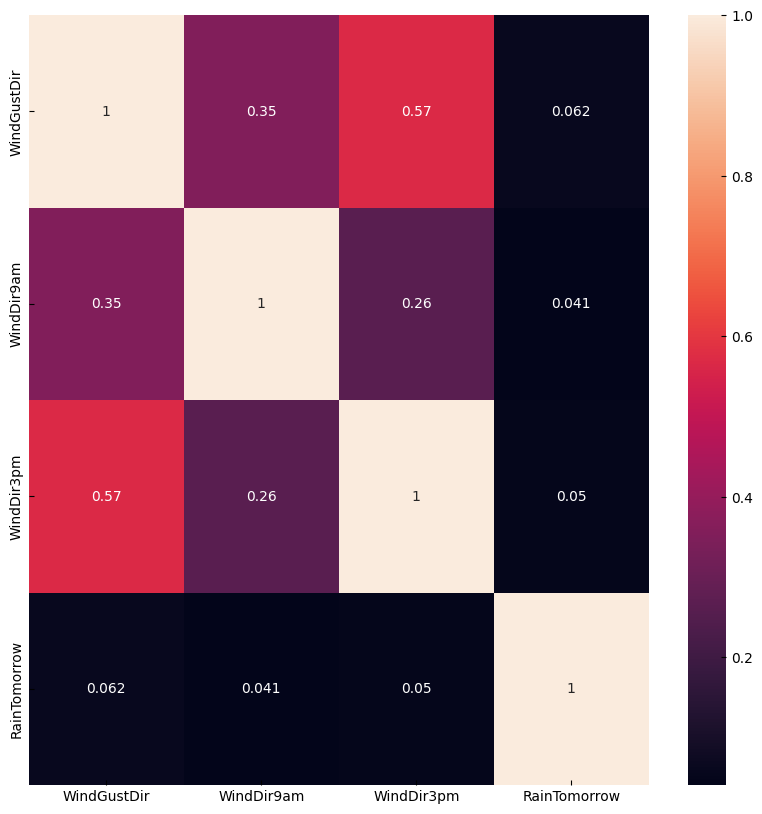

In [16]:
plt.figure(figsize = (10, 10))
sns.heatmap(dir_pair_data.corr(), annot=True)
plt.grid(False)

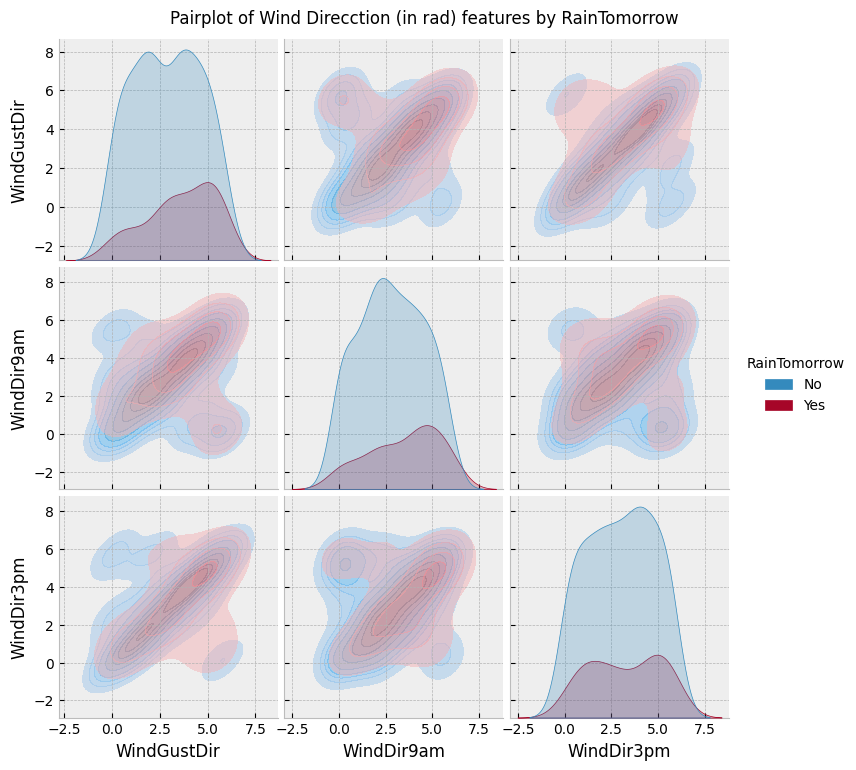

In [17]:
pairplot_df, _ = train_test_split(
    dir_pair_data,
    train_size=pairplot_sample_size,
    random_state=RANDOM_STATE,
    stratify=dir_pair_data[target_col]
)

pairplot_df[target_col] = pairplot_df[target_col].replace({1:'Yes', 0:'No'})

sns.pairplot(
    pairplot_df,
    vars = ['WindGustDir', 'WindDir9am', 'WindDir3pm'],
    hue = target_col,
    hue_order=["No", "Yes"],
    kind = "kde",
    plot_kws=dict(fill=True, alpha = 0.5)
)

plt.suptitle(f"Pairplot of Wind Direcction (in rad) features by {target_col}", y=1.02)
plt.show()

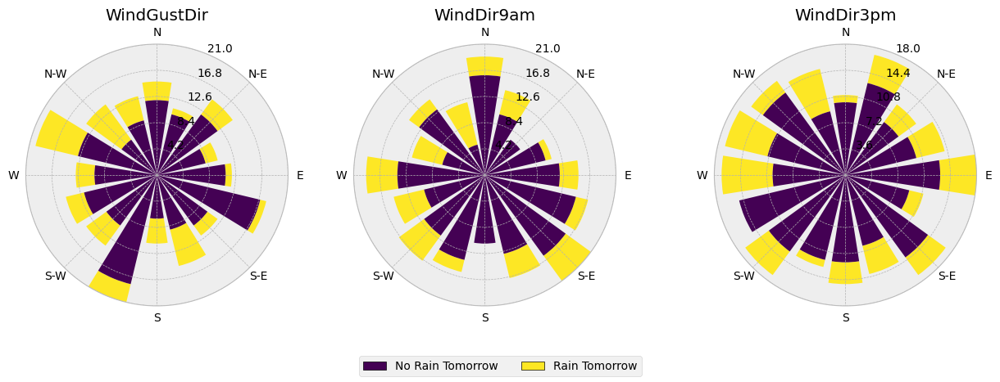

In [18]:
pairplot_df, _ = train_test_split(
    dir_pair_data,
    train_size=pairplot_sample_size,
    random_state=RANDOM_STATE,
    stratify=dir_pair_data[target_col]
)

fig = plt.figure(figsize=(8, 5))

ax1 = WindroseAxes.from_ax(fig=fig, rect=[0.05, 0.1, 0.4, 0.8])
ax2 = WindroseAxes.from_ax(fig=fig, rect=[0.55, 0.1, 0.4, 0.8])
ax3 = WindroseAxes.from_ax(fig=fig, rect=[1.1, 0.1, 0.4, 0.8])

ax1.bar(np.degrees(pairplot_df['WindGustDir']), pairplot_df[target_col])
ax2.bar(np.degrees(pairplot_df['WindDir9am']), pairplot_df[target_col])
ax3.bar(np.degrees(pairplot_df['WindDir3pm']), pairplot_df[target_col])

ax1.set_title("WindGustDir")
ax2.set_title("WindDir9am")
ax3.set_title("WindDir3pm")

legend_elements = [
    Patch(facecolor='#440154', edgecolor='black', label='No Rain Tomorrow'),
    Patch(facecolor='#FDE725', edgecolor='black', label='Rain Tomorrow')
]

fig.legend(
    handles=legend_elements,
    loc='lower center',
    ncol=2)


plt.show()

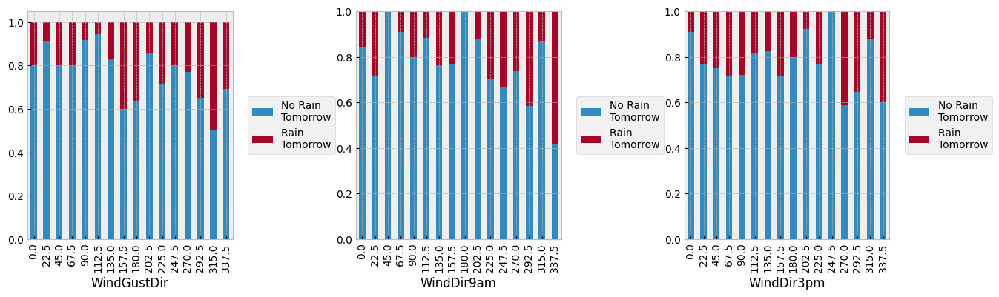

In [19]:
fig, ax = plt.subplots(1, 3, figsize = (15, 4))
ax = ax.flatten()
fig.subplots_adjust(wspace=0.6) 
for i, col in enumerate(pairplot_df.columns):
    if col != target_col:
        pd.crosstab(
            np.round(np.degrees(pairplot_df[col]), decimals = 1),
            pairplot_df[target_col],
            normalize='index'
        ).plot(kind='bar', stacked=True, ax = ax[i])
        ax[i].legend(["No Rain \nTomorrow", "Rain \nTomorrow"], bbox_to_anchor=(1.05, 0.5), loc='center left')

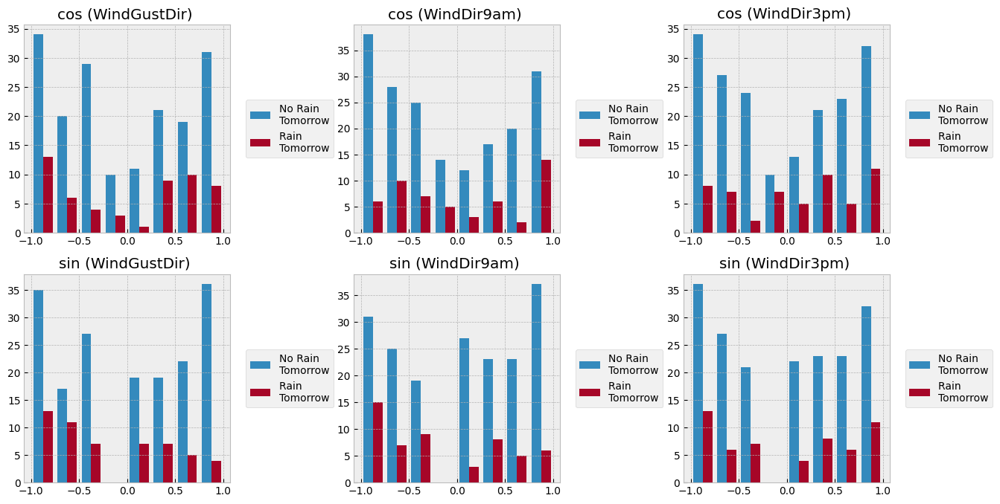

In [20]:
fig, ax = plt.subplots(2, 3, figsize = (15, 8))
ax = ax.flatten()
fig.subplots_adjust(wspace=0.6) 
for i, col in enumerate(pairplot_df.columns):
    if col != target_col:
        ax[i].hist([
            np.cos(pairplot_df[col][pairplot_df[target_col] == 0]),
            np.cos(pairplot_df[col][pairplot_df[target_col] == 1])
        ],
                   bins=8,
                   label=["No Rain \nTomorrow", "Rain \nTomorrow"],
                   histtype="bar",
                   stacked=False
                   )

        ax[i].set_title(f"cos ({col}) ")
        
        ax[i + 3].hist([
            np.sin(pairplot_df[col][pairplot_df[target_col] == 0]),
            np.sin(pairplot_df[col][pairplot_df[target_col] == 1])
        ],
                   bins=8,
                   label=["No Rain \nTomorrow", "Rain \nTomorrow"],
                   histtype="bar",
                   stacked=False
                   )

        ax[i + 3].set_title(f"sin ({col}) ")
        
        ax[i].legend(bbox_to_anchor=(1.05, 0.5), loc='center left')        
        ax[i + 3].legend(bbox_to_anchor=(1.05, 0.5), loc='center left') 

## Timestamp EDA

In [21]:
train_df_tmp = train_df[["Date"]].copy()

train_df_tmp["Date"] = pd.to_datetime(train_df_tmp["Date"])
train_df_tmp["day_of_week"] = train_df_tmp["Date"].dt.dayofweek
train_df_tmp["month"] = train_df_tmp["Date"].dt.month
train_df_tmp["is_weekend"] = (train_df_tmp["day_of_week"] >= 5).astype('int8')
train_df_tmp[target_col] = train_df[target_col].copy()

weekdays_short = dict(enumerate(["Mon", "Tue", "Wed", "Thu", "Fri", "Sat", "Sun"]))

display(train_df_tmp.head())

,Date,day_of_week,month,is_weekend,RainTomorrow
0,2017-04-24,0,4,0,1
1,2013-10-11,4,10,0,0
2,2012-02-18,5,2,1,0
3,2012-02-18,5,2,1,0
4,2011-10-11,1,10,0,0


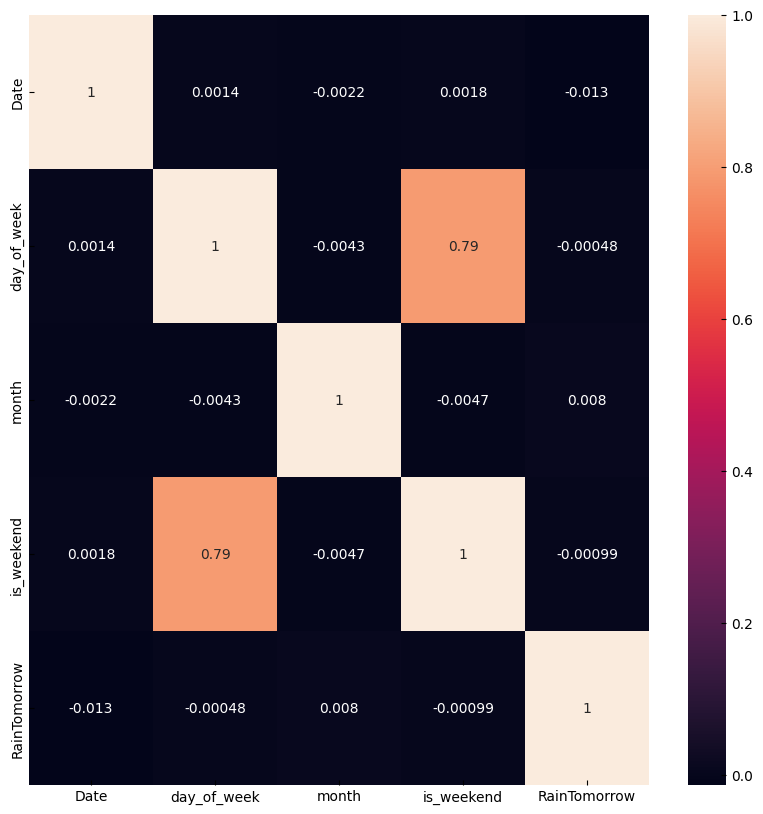

In [22]:
plt.figure(figsize = (10, 10))
sns.heatmap(train_df_tmp.corr(), annot=True)
plt.grid(False)

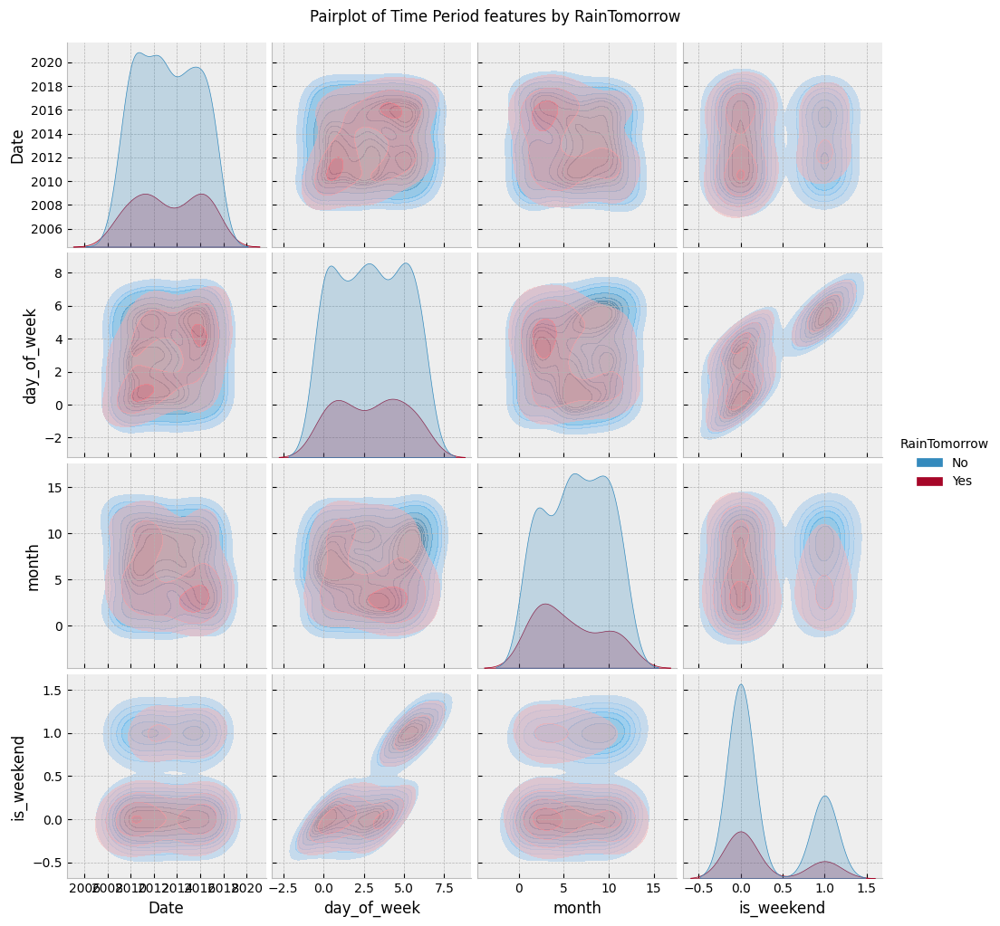

In [23]:
pairplot_df, _ = train_test_split(
    train_df_tmp,
    train_size=pairplot_sample_size,
    random_state=RANDOM_STATE,
    stratify=train_df_tmp[target_col]
)

pairplot_df[target_col] = pairplot_df[target_col].replace({1:'Yes', 0:'No'})

sns.pairplot(
    pairplot_df,
    vars = pairplot_df.drop(columns = [target_col]).columns.to_list(),
    hue = target_col,
    kind = "kde",
    hue_order=["No", "Yes"],
    plot_kws=dict(fill=True, alpha = 0.5)
)

plt.suptitle(f"Pairplot of Time Period features by {target_col}", y=1.02)
plt.show()

## Manual feature engineering

In [24]:
def manual_feature_engineering(df):
    df = df.copy()
   
    ts = pd.to_datetime(df["Date"])

    df["day_of_week"] = ts.dt.dayofweek
    df["month"] = ts.dt.month
    df["is_weekend"] = (df["day_of_week"] >= 5).astype(int)

    df["day_sin"] = np.sin(2 * np.pi * df["day_of_week"] / 7)
    df["day_cos"] = np.cos(2 * np.pi * df["day_of_week"] / 7)

    df["month_sin"] = np.sin(2 * np.pi * df["month"] / 12)
    df["month_cos"] = np.cos(2 * np.pi * df["month"] / 12)

    directions = [
        "N", "NNE", "NE", "ENE",
        "E", "ESE", "SE", "SSE",
        "S", "SSW", "SW", "WSW",
        "W", "WNW", "NW", "NNW"
        ]
    
    direction_to_rad = {d: i * np.pi / 8 for i, d in enumerate(directions)}


    
    df[['WindGustDir_rad', 'WindDir9am_rad', 'WindDir3pm_rad']] = df[['WindGustDir', 'WindDir9am', 'WindDir3pm']].replace(direction_to_rad).astype(float)
    df[['WindGustDir_cos', 'WindDir9am_cos', 'WindDir3pm_cos']] = np.cos(df[['WindGustDir_rad', 'WindDir9am_rad', 'WindDir3pm_rad']])
    df[['WindGustDir_sin', 'WindDir9am_sin', 'WindDir3pm_sin']] = np.sin(df[['WindGustDir_rad', 'WindDir9am_rad', 'WindDir3pm_rad']])

    df = df.drop(columns=["Date", "ID", 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'WindGustDir_rad', 'WindDir9am_rad', 'WindDir3pm_rad'])
    
    return df


train_df_fe = manual_feature_engineering(train_df)
test_df_fe = manual_feature_engineering(test_df)

display(train_df_fe.head())

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,...,day_sin,day_cos,month_sin,month_cos,WindGustDir_cos,WindDir9am_cos,WindDir3pm_cos,WindGustDir_sin,WindDir9am_sin,WindDir3pm_sin
0,Albany,14.5,17.8,14.2,NaN,NaN,NaN,0.0,NaN,94.0,...,0.000000,1.000000,0.866025,-0.5,NaN,NaN,NaN,NaN,NaN,NaN
1,Katherine,24.6,39.5,0.0,12.0,NaN,31.0,9.0,17.0,52.0,...,-0.433884,-0.900969,-0.866025,0.5,-7.071068e-01,1.000000,0.707107,0.707107,0.000000,-7.071068e-01
2,MelbourneAirport,14.7,26.6,0.2,3.2,8.0,30.0,7.0,11.0,87.0,...,-0.974928,-0.222521,0.866025,0.5,-9.238795e-01,-0.707107,-1.000000,0.382683,-0.707107,1.224647e-16
3,Williamtown,18.3,26.6,0.0,NaN,NaN,28.0,11.0,22.0,79.0,...,-0.974928,-0.222521,0.866025,0.5,-7.071068e-01,-0.382683,-0.923880,0.707107,-0.923880,3.826834e-01
4,Adelaide,11.4,19.3,0.6,2.4,8.9,31.0,13.0,19.0,63.0,...,0.781831,0.623490,-0.866025,0.5,-1.836970e-16,-0.707107,-0.923880,-1.000000,-0.707107,-3.826834e-01


In [25]:
categorical_cols = train_df_fe.drop(columns = [target_col]).select_dtypes(include=["object", "string"]).columns.tolist()
numeric_cols = train_df_fe.drop(columns = [target_col]).select_dtypes(include=['number']).columns.tolist()

print("Numeric columns:")
print(numeric_cols)

print("\nCategorical columns:")
print(categorical_cols)


Numeric columns:
['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm', 'day_of_week', 'month', 'is_weekend', 'day_sin', 'day_cos', 'month_sin', 'month_cos', 'WindGustDir_cos', 'WindDir9am_cos', 'WindDir3pm_cos', 'WindGustDir_sin', 'WindDir9am_sin', 'WindDir3pm_sin']

Categorical columns:
['Location', 'RainToday']


In [26]:
numeric_preprocess_scaled = Pipeline(
    steps=[
        ("imputer", SimpleImputer(strategy="median")),
        ("scaler", StandardScaler())
    ]
)

numeric_preprocess_unscaled = Pipeline(
    steps=[
        ("imputer", SimpleImputer(strategy="median"))
    ]
)

categorical_preprocess_dense = Pipeline(
    steps=[
        ("imputer", SimpleImputer(strategy="most_frequent")),
        ("encoder", OneHotEncoder(handle_unknown="ignore", sparse_output=False))
    ]
)

categorical_preprocess_sparse = Pipeline(
    steps=[
        ("imputer", SimpleImputer(strategy="most_frequent")),
        ("encoder", OneHotEncoder(handle_unknown="ignore", sparse_output=True))
    ]
)

preprocessor_scaled_sparse = ColumnTransformer(
    transformers=[
        ("num", numeric_preprocess_scaled, numeric_cols),
        ("cat", categorical_preprocess_sparse, categorical_cols)
    ]
)

preprocessor_unscaled_dense = ColumnTransformer(
    transformers=[
        ("num", numeric_preprocess_unscaled, numeric_cols),
        ("cat", categorical_preprocess_dense, categorical_cols)
    ]
)

## Evaluation function

In [27]:
def evaluate_classifier(name, model, X_train, X_valid, y_train, y_valid):
    model.fit(X_train, y_train)

    pred = model.predict(X_valid)

    if hasattr(model, "predict_proba"):
        proba = model.predict_proba(X_valid)[:, 1]
    elif hasattr(model, "decision_function"):
        scores = model.decision_function(X_valid)
        proba = (scores - scores.min()) / (scores.max() - scores.min() + 1e-12)
    else:
        proba = pred

    metrics = {
        "model": name,
        "accuracy": accuracy_score(y_valid, pred),
        "balanced_accuracy": balanced_accuracy_score(y_valid, pred),
        "precision": precision_score(y_valid, pred, zero_division=0),
        "recall": recall_score(y_valid, pred, zero_division=0),
        "f1": f1_score(y_valid, pred, zero_division=0),
        "roc_auc": roc_auc_score(y_valid, proba),
        "pr_auc": average_precision_score(y_valid, proba)
    }

    print(f"\n{name}")
    print("-" * len(name))
    for k, v in metrics.items():
        if k != "model":
            print(f"{k}: {v:.3f}")

    return metrics, pred, proba

## Train/validation split

In [28]:
X = train_df_fe.drop(columns=[target_col])
y = train_df_fe[target_col]

X_train, X_valid, y_train, y_valid = train_test_split(
    X,
    y,
    test_size=0.2,
    random_state=RANDOM_STATE,
    stratify=y
)

print("X_train:", X_train.shape)
print("X_valid:", X_valid.shape)
print("y_train ratio:")
print(y_train.value_counts(normalize=True))
print("y_valid ratio:")
print(y_valid.value_counts(normalize=True))

X_train: (91008, 31)
X_valid: (22753, 31)
y_train ratio:
RainTomorrow
0    0.776228
1    0.223772
Name: proportion, dtype: float64
y_valid ratio:
RainTomorrow
0    0.776205
1    0.223795
Name: proportion, dtype: float64


## Models

In [29]:
all_models_metrics = []
all_models_pred = []
all_models_proba = []

### Majority class

In [30]:
majority_pred = np.zeros_like(y_valid)
majority_proba = np.zeros_like(y_valid, dtype=float)

majority_metrics = {
    "model": "Majority Class",
    "accuracy": accuracy_score(y_valid, majority_pred),
    "balanced_accuracy": balanced_accuracy_score(y_valid, majority_pred),
    "precision": precision_score(y_valid, majority_pred, zero_division=0),
    "recall": recall_score(y_valid, majority_pred, zero_division=0),
    "f1": f1_score(y_valid, majority_pred, zero_division=0),
    "roc_auc": 0.5,
    "pr_auc": y_valid.mean()
}


all_models_metrics.append(majority_metrics)
all_models_pred.append(majority_pred)
all_models_proba.append(majority_proba)

display(pd.DataFrame([majority_metrics]))

,model,accuracy,balanced_accuracy,precision,recall,f1,roc_auc,pr_auc
0,Majority Class,0.776205,0.5,0.0,0.0,0.0,0.5,0.223795


### Logistic Regression

In [31]:
logistic_model = Pipeline(
    steps=[
        ("preprocess", preprocessor_scaled_sparse),
        ("model", LogisticRegression(
            max_iter=2000,
            random_state=RANDOM_STATE
        ))
    ]
)

log_metrics, log_pred, log_proba = evaluate_classifier(
    "Logistic Regression",
    logistic_model,
    X_train,
    X_valid,
    y_train,
    y_valid
)


all_models_metrics.append(log_metrics)
all_models_pred.append(log_pred)
all_models_proba.append(log_proba)


Logistic Regression
-------------------
accuracy: 0.849
balanced_accuracy: 0.732
precision: 0.729
recall: 0.519
f1: 0.606
roc_auc: 0.874
pr_auc: 0.713


### Random Forest

In [32]:
rf_model = Pipeline(
    steps=[
        ("preprocess", preprocessor_unscaled_dense),
        ("model", RandomForestClassifier(
            n_estimators = 500,
            max_depth = 22,
            min_samples_leaf = 5,
            n_jobs = -1,
            random_state = RANDOM_STATE
        ))
    ]
)

rf_metrics, rf_pred, rf_proba = evaluate_classifier(
    "Random Forest",
    rf_model,
    X_train,
    X_valid,
    y_train,
    y_valid
)

all_models_metrics.append(rf_metrics)
all_models_pred.append(rf_pred)
all_models_proba.append(rf_proba)


Random Forest
-------------
accuracy: 0.857
balanced_accuracy: 0.727
precision: 0.787
recall: 0.493
f1: 0.606
roc_auc: 0.890
pr_auc: 0.740


### Gradient Boosting

In [33]:
gb_model = Pipeline(
    steps=[
        ("preprocess", preprocessor_unscaled_dense),
        ("model", GradientBoostingClassifier(
            n_estimators = 100,
            random_state = RANDOM_STATE
        ))
    ]
)

gb_metrics, gb_pred, gb_proba = evaluate_classifier(
    "GradientBoosting",
    gb_model,
    X_train,
    X_valid,
    y_train,
    y_valid
)

all_models_metrics.append(gb_metrics)
all_models_pred.append(gb_pred)
all_models_proba.append(gb_proba)


GradientBoosting
----------------
accuracy: 0.853
balanced_accuracy: 0.729
precision: 0.754
recall: 0.506
f1: 0.606
roc_auc: 0.879
pr_auc: 0.725


### HistGradientBoosting

In [34]:
hgb_model = Pipeline(
    steps=[
        ("preprocess", preprocessor_unscaled_dense),
        ("model", HistGradientBoostingClassifier(
            max_iter=450,
            learning_rate=0.055,
            max_leaf_nodes=55,
            l2_regularization=0.005,
            random_state=RANDOM_STATE
        ))
    ]
)

hgb_metrics, hgb_pred, hgb_proba = evaluate_classifier(
    "HistGradientBoosting",
    hgb_model,
    X_train,
    X_valid,
    y_train,
    y_valid
)

all_models_metrics.append(hgb_metrics)
all_models_pred.append(hgb_pred)
all_models_proba.append(hgb_proba)


HistGradientBoosting
--------------------
accuracy: 0.862
balanced_accuracy: 0.754
precision: 0.762
recall: 0.557
f1: 0.644
roc_auc: 0.897
pr_auc: 0.758


### XGBoost

In [35]:
xgb_model = Pipeline(
    steps=[
        ("preprocess", preprocessor_unscaled_dense),
        ("model", XGBClassifier(
            n_estimators=550,
            max_depth=6,
            learning_rate=0.045,
            subsample=0.92,
            colsample_bytree=0.90,
            min_child_weight=6,
            reg_lambda=1.5,
            objective="binary:logistic",
            eval_metric="logloss",
            random_state=RANDOM_STATE,
            n_jobs=-1
        ))
    ]
)

xgb_metrics, xgb_pred, xgb_proba = evaluate_classifier(
    "XGBoost",
    xgb_model,
    X_train,
    X_valid,
    y_train,
    y_valid
)


all_models_metrics.append(xgb_metrics)
all_models_pred.append(xgb_pred)
all_models_proba.append(xgb_proba)


XGBoost
-------
accuracy: 0.865
balanced_accuracy: 0.758
precision: 0.769
recall: 0.565
f1: 0.651
roc_auc: 0.901
pr_auc: 0.766


 ### SVM with RBF kernel

In [36]:
SVM_SAMPLE_SIZE = 12_000

X_svm, _, y_svm, _ = train_test_split(
    X,
    y,
    train_size=SVM_SAMPLE_SIZE,
    random_state=RANDOM_STATE,
    stratify=y
)

del _

X_svm_train, X_svm_valid, y_svm_train, y_svm_valid = train_test_split(
    X_svm,
    y_svm,
    test_size=0.25,
    random_state=RANDOM_STATE,
    stratify=y_svm
)

svm_rbf_model = Pipeline(
    steps=[
        ("preprocess", preprocessor_scaled_sparse),
        ("model", SVC(
            kernel="rbf",
            C=2.0,
            gamma="scale",
            probability=True,
            random_state=RANDOM_STATE
        ))
    ]
)

svm_rbf_metrics, svm_rbf_pred, svm_rbf_proba = evaluate_classifier(
    f"SVM RBF on {SVM_SAMPLE_SIZE:,} sampled rows",
    svm_rbf_model,
    X_svm_train,
    X_svm_valid,
    y_svm_train,
    y_svm_valid
)

all_models_metrics.append(svm_rbf_metrics)
all_models_pred.append(svm_rbf_pred)
all_models_proba.append(svm_rbf_proba)


SVM RBF on 12,000 sampled rows
------------------------------
accuracy: 0.846
balanced_accuracy: 0.717
precision: 0.735
recall: 0.484
f1: 0.584
roc_auc: 0.855
pr_auc: 0.702


 ### SVM with Sigmoid kernel

In [37]:
svm_sigm_model = Pipeline(
    steps=[
        ("preprocess", preprocessor_scaled_sparse),
        ("model", SVC(
            kernel="sigmoid",
            C=2.0,
            gamma="scale",
            probability=True,
            random_state=RANDOM_STATE
        ))
    ]
)

svm_sigm_metrics, svm_sigm_pred, svm_sigm_proba = evaluate_classifier(
    f"SVM Sigmoid on {SVM_SAMPLE_SIZE:,} sampled rows",
    svm_sigm_model,
    X_svm_train,
    X_svm_valid,
    y_svm_train,
    y_svm_valid
)

all_models_metrics.append(svm_sigm_metrics)
all_models_pred.append(svm_sigm_pred)
all_models_proba.append(svm_sigm_proba)


SVM Sigmoid on 12,000 sampled rows
----------------------------------
accuracy: 0.763
balanced_accuracy: 0.655
precision: 0.470
recall: 0.459
f1: 0.464
roc_auc: 0.753
pr_auc: 0.449


## Compare models

In [38]:
metrics_df = pd.DataFrame(all_models_metrics)
display(metrics_df.sort_values("accuracy", ascending=False))

,model,accuracy,balanced_accuracy,precision,recall,f1,roc_auc,pr_auc
5,XGBoost,0.864589,0.757845,0.768922,0.564611,0.651115,0.900546,0.765738
4,HistGradientBoosting,0.861908,0.753532,0.761675,0.557345,0.643683,0.897176,0.758376
2,Random Forest,0.856634,0.727144,0.787014,0.492734,0.606039,0.890444,0.740091
3,GradientBoosting,0.852591,0.729291,0.754391,0.506088,0.605783,0.878725,0.725319
1,Logistic Regression,0.849251,0.731752,0.729305,0.519049,0.606471,0.873728,0.713282
6,"SVM RBF on 12,000 sampled rows",0.845667,0.717058,0.735294,0.484352,0.584007,0.854563,0.701543
0,Majority Class,0.776205,0.500000,0.000000,0.000000,0.000000,0.500000,0.223795
7,"SVM Sigmoid on 12,000 sampled rows",0.763000,0.654798,0.469512,0.459016,0.464205,0.752717,0.448826


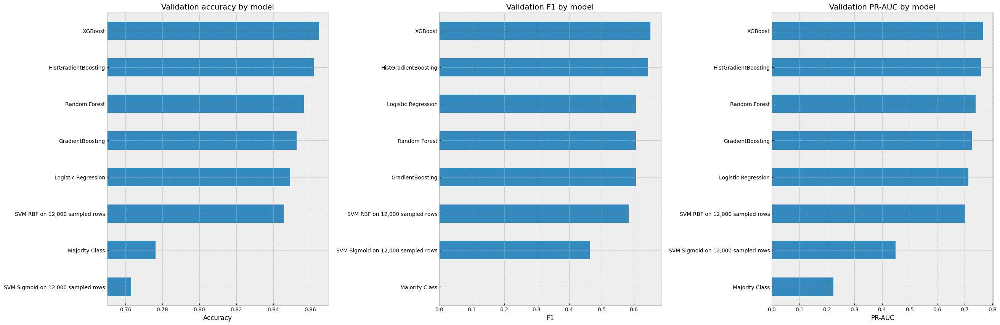

In [39]:
fig, ax = plt.subplots(1, 3, figsize = (30, 10))
ax = ax.flatten()

metrics_df.set_index("model")["accuracy"].sort_values().plot(kind="barh", ax = ax[0])
ax[0].set_title("Validation accuracy by model")
ax[0].set_xlabel("Accuracy")
ax[0].set_xlim(xmin=0.75, xmax=0.87)
ax[0].set_ylabel(None) 

metrics_df.set_index("model")["f1"].sort_values().plot(kind="barh", ax = ax[1])
ax[1].set_title("Validation F1 by model")
ax[1].set_xlabel("F1")
ax[1].set_ylabel(None) 

metrics_df.set_index("model")["pr_auc"].sort_values().plot(kind="barh", ax = ax[2])
ax[2].set_title("Validation PR-AUC by model")
ax[2].set_xlabel("PR-AUC")
ax[2].set_ylabel(None) 

plt.subplots_adjust(wspace=0.5, hspace=0.2) 
plt.show()

## Confusion matrices

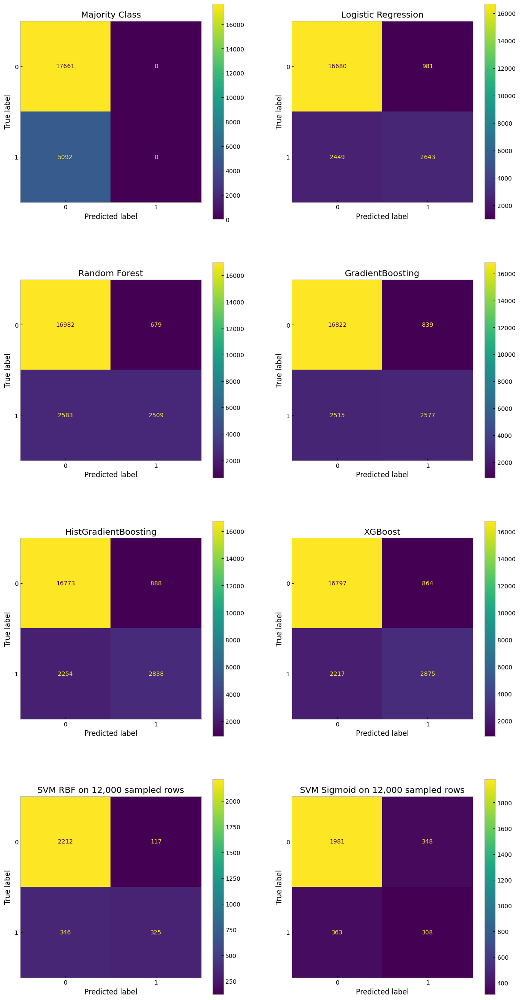

In [40]:
predictions = dict(zip([all_models_metrics[i]['model'] for i in range(len(all_models_metrics))], all_models_pred))

fig, ax = plt.subplots(4, 2, figsize = (15, 30))
ax = ax.flatten()

for i, (name, pred) in enumerate(predictions.items()):
    if name in ['SVM RBF on 12,000 sampled rows',
                'SVM Sigmoid on 12,000 sampled rows']:
        y_test = y_svm_valid
    else: y_test = y_valid
    cm = confusion_matrix(y_test, pred)
    disp = ConfusionMatrixDisplay(cm, display_labels=[0, 1])
    disp.plot(ax = ax[i])
    ax[i].set_title(name)
    ax[i].grid(False)
    
plt.show()

## ROC and Precision-Recall curves

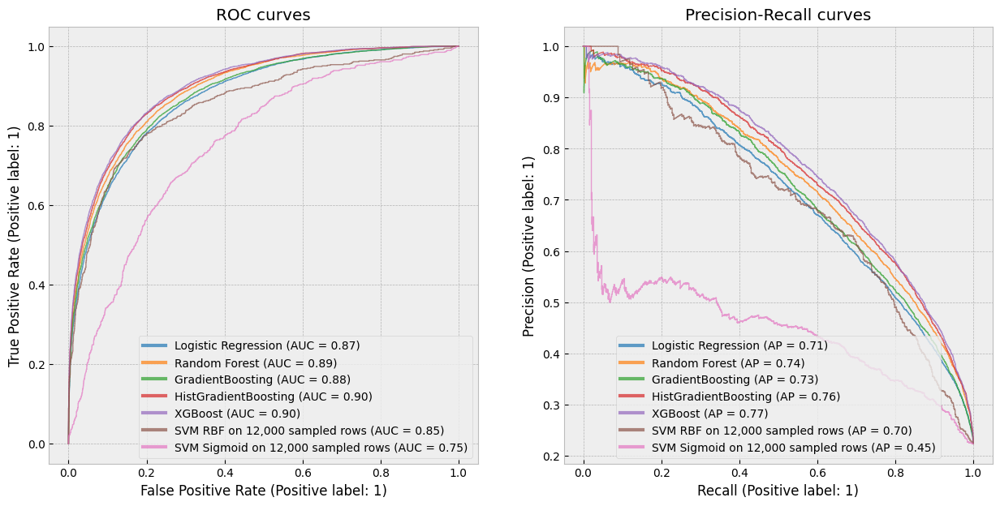

In [41]:
probabilities = dict(zip([all_models_metrics[i]['model'] for i in range(1, len(all_models_metrics))], all_models_proba[1:]))

fig, ax = plt.subplots(1, 2, figsize = (15, 7))
ax = ax.flatten()
#fig.subplots_adjust(wspace=1.5) 

colors = plt.get_cmap('tab10').colors

for i, (name, proba) in enumerate(probabilities.items()):
    if name in ['SVM RBF on 12,000 sampled rows',
                'SVM Sigmoid on 12,000 sampled rows']:
        y_test = y_svm_valid
    else: y_test = y_valid
    RocCurveDisplay.from_predictions(y_test, proba, name=name, ax=ax[0], alpha = 0.7, color=colors[i], linewidth=1)
    
    PrecisionRecallDisplay.from_predictions(y_test, proba, name=name, ax=ax[1], alpha = 0.7, color=colors[i], linewidth=1)

ax[0].set_title("ROC curves")


ax[1].set_title("Precision-Recall curves")
ax[1].legend(loc='lower center')

for axis in ax:
    legend = axis.get_legend()
    
    for line in legend.get_lines():
        line.set_linewidth(3)

plt.show()

## Threshold tuning

Best model by PR-AUC: XGBoost


,threshold,precision,recall,f1,accuracy
28,0.33,0.658704,0.714847,0.685628,0.853294
29,0.34,0.665243,0.703653,0.683909,0.854437
27,0.32,0.649700,0.721917,0.683907,0.850657
32,0.37,0.689586,0.677533,0.683507,0.859579
26,0.31,0.642524,0.729969,0.683461,0.848679
30,0.35,0.673403,0.693637,0.683370,0.856151
31,0.36,0.680930,0.684407,0.682664,0.857601
24,0.29,0.625965,0.748036,0.681578,0.843581
25,0.30,0.633086,0.738020,0.681538,0.845647
33,0.38,0.696026,0.667321,0.681372,0.860326


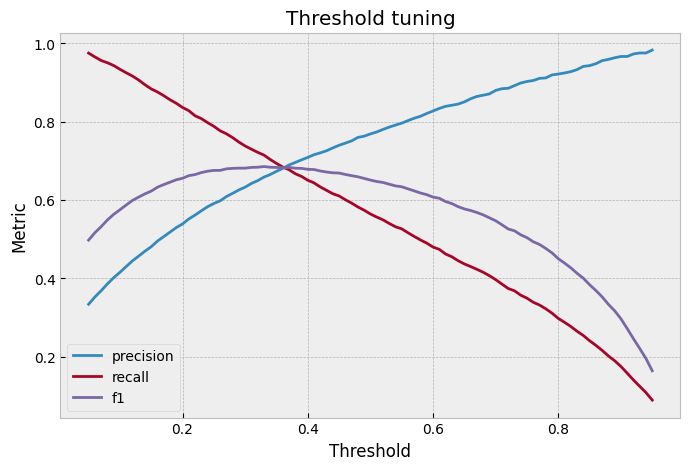

In [42]:
def threshold_search(y_true, proba):
    thresholds = np.linspace(0.05, 0.95, 91)
    rows = []

    for t in thresholds:
        pred = (proba >= t).astype(int)
        rows.append({
            "threshold": t,
            "precision": precision_score(y_true, pred, zero_division=0),
            "recall": recall_score(y_true, pred, zero_division=0),
            "f1": f1_score(y_true, pred, zero_division=0),
            "accuracy": accuracy_score(y_true, pred)
        })

    return pd.DataFrame(rows)

best_model_name = metrics_df.sort_values("pr_auc", ascending=False).iloc[0]["model"]
print("Best model by PR-AUC:", best_model_name)

best_proba_for_threshold = probabilities.get(best_model_name)

threshold_df = threshold_search(y_valid, best_proba_for_threshold)
display(threshold_df.sort_values("f1", ascending=False).head(10))

plt.figure(figsize=(8, 5))
plt.plot(threshold_df["threshold"], threshold_df["precision"], label="precision")
plt.plot(threshold_df["threshold"], threshold_df["recall"], label="recall")
plt.plot(threshold_df["threshold"], threshold_df["f1"], label="f1")
plt.xlabel("Threshold")
plt.ylabel("Metric")
plt.title("Threshold tuning")
plt.legend()
plt.grid(True)
plt.show()

## Feature Importance

,feature,importance_mean,importance_std
10,Humidity3pm,0.07416,0.002170
12,Pressure3pm,0.05740,0.002280
6,WindGustSpeed,0.02264,0.001882
0,Location,0.01024,0.000528
2,MaxTemp,0.00984,0.003063
5,Sunshine,0.00820,0.002028
11,Pressure9am,0.00368,0.002058
14,Cloud3pm,0.00244,0.001428
1,MinTemp,0.00240,0.000379
27,WindDir3pm_cos,0.00192,0.001366


<Figure size 900x600 with 0 Axes>

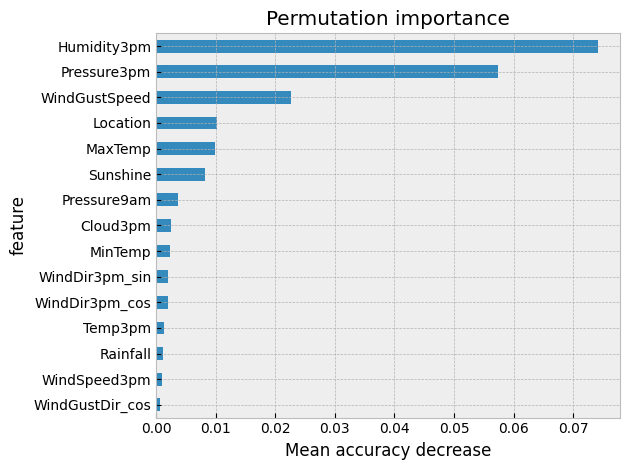

In [43]:
importance_sample_size = min(5000, len(X_valid))

X_imp = X_valid.sample(n=importance_sample_size, random_state=RANDOM_STATE)
y_imp = y_valid.loc[X_imp.index]

model_for_importance = xgb_model

perm = permutation_importance(
    model_for_importance,
    X_imp,
    y_imp,
    n_repeats=5,
    random_state=RANDOM_STATE,
    scoring="accuracy",
    n_jobs=-1
)

importance_df = pd.DataFrame({
    "feature": X_imp.columns,
    "importance_mean": perm.importances_mean,
    "importance_std": perm.importances_std
}).sort_values("importance_mean", ascending=False)

display(importance_df.head(15))

plt.figure(figsize=(9, 6))
importance_df.head(15).sort_values("importance_mean").plot(
    kind="barh",
    x="feature",
    y="importance_mean",
    legend=False
)
plt.title("Permutation importance")
plt.xlabel("Mean accuracy decrease")
plt.tight_layout()
plt.show()

## Feature engineering as a pipeline step

In [44]:
def pipeline_feature_engineering(df):
    df = df.copy()
   
    ts = pd.to_datetime(df["Date"])

    df["day_of_week"] = ts.dt.dayofweek
    df["month"] = ts.dt.month
    df["is_weekend"] = (df["day_of_week"] >= 5).astype(int)

    df["day_sin"] = np.sin(2 * np.pi * df["day_of_week"] / 7)
    df["day_cos"] = np.cos(2 * np.pi * df["day_of_week"] / 7)

    df["month_sin"] = np.sin(2 * np.pi * df["month"] / 12)
    df["month_cos"] = np.cos(2 * np.pi * df["month"] / 12)


    directions = [
        "N", "NNE", "NE", "ENE",
        "E", "ESE", "SE", "SSE",
        "S", "SSW", "SW", "WSW",
        "W", "WNW", "NW", "NNW"
        ]
    
    direction_to_rad = {d: i * np.pi / 8 for i, d in enumerate(directions)}
    
    df[['WindGustDir_rad', 'WindDir9am_rad', 'WindDir3pm_rad']] = df[['WindGustDir', 'WindDir9am', 'WindDir3pm']].replace(direction_to_rad).astype(float)
    df[['WindGustDir_cos', 'WindDir9am_cos', 'WindDir3pm_cos']] = np.cos(df[['WindGustDir_rad', 'WindDir9am_rad', 'WindDir3pm_rad']])
    df[['WindGustDir_sin', 'WindDir9am_sin', 'WindDir3pm_sin']] = np.sin(df[['WindGustDir_rad', 'WindDir9am_rad', 'WindDir3pm_rad']])

    df = df.drop(columns=["Date", "ID", 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'WindGustDir_rad', 'WindDir9am_rad', 'WindDir3pm_rad'])

    return df


feature_engineering_step = FunctionTransformer(
    pipeline_feature_engineering,
    validate=False
)

##  Define columns after feature engineering

In [45]:
sample_after_fe = pipeline_feature_engineering(train_df.drop(columns=[target_col]).head(10))

categorical_cols_pipeline = sample_after_fe.select_dtypes(include=["object", "string"]).columns.tolist()
numeric_cols_pipeline = [col for col in sample_after_fe.columns if col not in categorical_cols_pipeline]

print("Numeric columns after feature engineering:")
print(numeric_cols_pipeline)

print("\nCategorical columns after feature engineering:")
print(categorical_cols_pipeline)

Numeric columns after feature engineering:
['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm', 'day_of_week', 'month', 'is_weekend', 'day_sin', 'day_cos', 'month_sin', 'month_cos', 'WindGustDir_cos', 'WindDir9am_cos', 'WindDir3pm_cos', 'WindGustDir_sin', 'WindDir9am_sin', 'WindDir3pm_sin']

Categorical columns after feature engineering:
['Location', 'RainToday']


## Preprocessing pipeline

In [46]:
numeric_pipeline = Pipeline(
    steps=[
        ("imputer", SimpleImputer(strategy="median")),
        ("scaler", StandardScaler())
    ]
)

categorical_pipeline = Pipeline(
    steps=[
        ("imputer", SimpleImputer(strategy="most_frequent")),
        ("encoder", OneHotEncoder(handle_unknown="ignore", sparse_output=False))
    ]
)

preprocessor_pipeline = ColumnTransformer(
    transformers=[
        ("num", numeric_pipeline, numeric_cols_pipeline),
        ("cat", categorical_pipeline, categorical_cols_pipeline)
    ],
    remainder="drop"
)

## Build a general modeling pipeline

In [47]:
base_pipeline = Pipeline(
    steps=[
        ("features", feature_engineering_step),
        ("preprocess", preprocessor_pipeline),
        ("model", LogisticRegression(max_iter=1000))
    ]
)

## Prepare data for pipeline training

In [48]:
X_raw = train_df.drop(columns=[target_col])
y_raw = train_df[target_col]

X_train_raw, X_valid_raw, y_train_raw, y_valid_raw = train_test_split(
    X_raw,
    y_raw,
    test_size=0.2,
    random_state=RANDOM_STATE,
    stratify=y_raw
)

print("X_train_raw:", X_train_raw.shape)
print("X_valid_raw:", X_valid_raw.shape)

X_train_raw: (91008, 23)
X_valid_raw: (22753, 23)


## GridSearchCV setup

In [49]:
param_grid = [
    {
        "model": [LogisticRegression(max_iter=1500, random_state=RANDOM_STATE)],
        "model__C": [0.3, 1.0, 3.0],
        "model__class_weight": [None, "balanced"]
    },
    {
        "model": [RandomForestClassifier(
            n_jobs=-1,
            random_state=RANDOM_STATE
        )],
        "model__n_estimators": [300],
        "model__max_depth": [16, 22],
        "model__min_samples_leaf": [5, 10],
        "model__max_features": ["sqrt"]
    },
    {
        "model": [HistGradientBoostingClassifier(
            random_state=RANDOM_STATE
        )],
        "model__max_iter": [300, 450],
        "model__learning_rate": [0.04, 0.06],
        "model__max_leaf_nodes": [31, 55],
        "model__l2_regularization": [0.005]
    },
    {
        "model": [XGBClassifier(
            objective="binary:logistic",
            eval_metric="logloss",
            random_state=RANDOM_STATE,
            n_jobs=-1
        )],
        "model__n_estimators": [350, 550],
        "model__max_depth": [4, 6],
        "model__learning_rate": [0.04, 0.06],
        "model__subsample": [0.9],
        "model__colsample_bytree": [0.9],
        "model__min_child_weight": [5],
        "model__reg_lambda": [1.5]
    }]

print("Number of grid blocks:", len(param_grid))

Number of grid blocks: 4


## GridSearchCV

In [50]:
cv = StratifiedKFold(
    n_splits=3,
    shuffle=True,
    random_state=RANDOM_STATE
)

grid_search = GridSearchCV(
    estimator=base_pipeline,
    param_grid=param_grid,
    scoring={
        "accuracy": "accuracy",
        "balanced_accuracy": "balanced_accuracy",
        "f1": "f1",
        "roc_auc": "roc_auc",
        "average_precision": "average_precision"
    },
    refit="roc_auc",
    cv=cv,
    n_jobs=-1,
    verbose=2,
    return_train_score=True
)

grid_search.fit(X_train_raw, y_train_raw)

print("Best parameters:")
print(grid_search.best_params_)

print("\nBest CV ROC-AUC:")
print(grid_search.best_score_)

Fitting 3 folds for each of 26 candidates, totalling 78 fits
Best parameters:
{'model': XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.9, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, feature_weights=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.06, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=6, max_leaves=None,
              min_child_weight=5, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=550, n_jobs=-1,
              num_parallel_tree=None, ...), 'model__colsample_bytree': 0.9, 'model__learning_rate': 0.06, 'model__max_depth': 6, 'model__min_child_weight': 5, 'model__n_estimators': 550

## Analyze grid search results

,rank_test_roc_auc,mean_test_accuracy,mean_test_balanced_accuracy,mean_test_f1,mean_test_roc_auc,mean_test_average_precision,mean_train_average_precision,param_model
25,1,0.862166,0.754508,0.645032,0.895592,0.756192,0.875615,"XGBClassifier(base_score=None, booster=None, c..."
21,2,0.861463,0.751626,0.641047,0.893874,0.753264,0.845242,"XGBClassifier(base_score=None, booster=None, c..."
24,3,0.861001,0.750612,0.639436,0.893172,0.751468,0.839527,"XGBClassifier(base_score=None, booster=None, c..."
23,4,0.859298,0.746807,0.633401,0.890746,0.746957,0.798023,"XGBClassifier(base_score=None, booster=None, c..."
13,5,0.859056,0.748888,0.635680,0.890725,0.747038,0.840912,HistGradientBoostingClassifier(random_state=42)
11,6,0.859067,0.748441,0.635162,0.890420,0.746395,0.831585,HistGradientBoostingClassifier(random_state=42)
20,7,0.859188,0.745216,0.631392,0.890393,0.746460,0.814342,"XGBClassifier(base_score=None, booster=None, c..."
16,8,0.858979,0.749380,0.636196,0.890256,0.746248,0.840123,HistGradientBoostingClassifier(random_state=42)
17,9,0.858771,0.748145,0.634555,0.889722,0.744984,0.829451,HistGradientBoostingClassifier(random_state=42)
15,9,0.858771,0.748145,0.634555,0.889722,0.744984,0.829451,HistGradientBoostingClassifier(random_state=42)


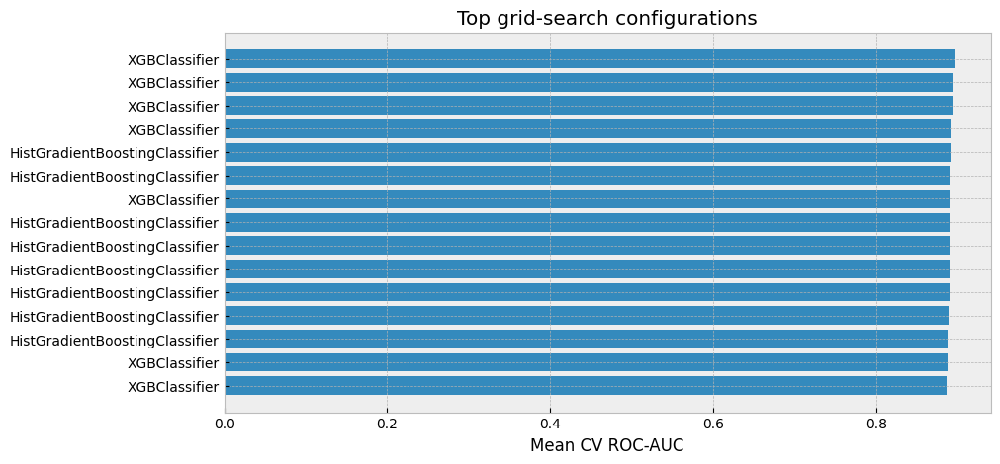

In [51]:
cv_results = pd.DataFrame(grid_search.cv_results_)

cols_to_show = [
    "rank_test_roc_auc",
    "mean_test_accuracy",
    "mean_test_balanced_accuracy",
    "mean_test_f1",
    "mean_test_roc_auc",
    "mean_test_average_precision",
    "mean_train_average_precision",
    "param_model"
]

display(
    cv_results[cols_to_show]
    .sort_values("rank_test_roc_auc")
    .head(15)
)

plt.figure(figsize=(10, 5))
top_results = cv_results.sort_values("rank_test_roc_auc").head(15).copy()
top_results["model_name"] = top_results["param_model"].astype(str).str.split("(").str[0]
plt.barh(range(len(top_results)), top_results["mean_test_roc_auc"])
plt.yticks(range(len(top_results)), top_results["model_name"])
plt.xlabel("Mean CV ROC-AUC")
plt.title("Top grid-search configurations")
plt.gca().invert_yaxis()
plt.show()

## Validate the best pipeline on the holdout validation set

In [52]:
best_pipeline = grid_search.best_estimator_

valid_pred = best_pipeline.predict(X_valid_raw)

if hasattr(best_pipeline, "predict_proba"):
    valid_proba = best_pipeline.predict_proba(X_valid_raw)[:, 1]
else:
    valid_scores = best_pipeline.decision_function(X_valid_raw)
    valid_proba = (valid_scores - valid_scores.min()) / (valid_scores.max() - valid_scores.min() + 1e-12)

final_valid_metrics = {
    "accuracy": accuracy_score(y_valid_raw, valid_pred),
    "balanced_accuracy": balanced_accuracy_score(y_valid_raw, valid_pred),
    "precision": precision_score(y_valid_raw, valid_pred, zero_division=0),
    "recall": recall_score(y_valid_raw, valid_pred, zero_division=0),
    "f1": f1_score(y_valid_raw, valid_pred, zero_division=0),
    "roc_auc": roc_auc_score(y_valid_raw, valid_proba),
    "pr_auc": average_precision_score(y_valid_raw, valid_proba)
}

display(pd.DataFrame([final_valid_metrics]))

print(classification_report(y_valid_raw, valid_pred))

,accuracy,balanced_accuracy,precision,recall,f1,roc_auc,pr_auc
0,0.865512,0.760885,0.768215,0.571485,0.655405,0.901978,0.767864


              precision    recall  f1-score   support

           0       0.88      0.95      0.92     17661
           1       0.77      0.57      0.66      5092

    accuracy                           0.87     22753
   macro avg       0.83      0.76      0.79     22753
weighted avg       0.86      0.87      0.86     22753



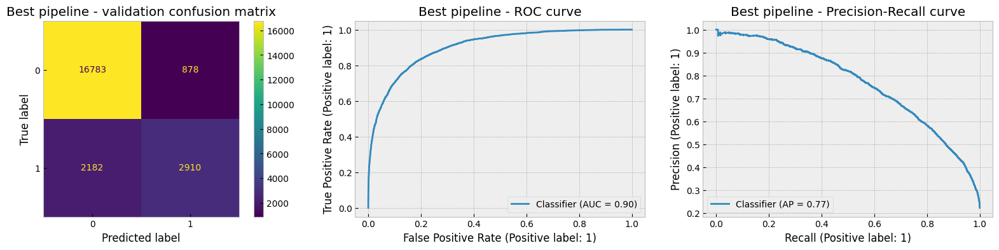

In [53]:
cm = confusion_matrix(y_valid_raw, valid_pred)
fig, ax = plt.subplots(1, 3, figsize = (20, 4))
ax = ax.flatten()
      
disp = ConfusionMatrixDisplay(cm, display_labels=[0, 1])
disp.plot(ax = ax[0])
ax[0].set_title("Best pipeline - validation confusion matrix")
ax[0].grid(False)

RocCurveDisplay.from_predictions(y_valid_raw, valid_proba, ax = ax[1])
ax[1].set_title("Best pipeline - ROC curve")

PrecisionRecallDisplay.from_predictions(y_valid_raw, valid_proba, ax = ax[2])
ax[2].set_title("Best pipeline - Precision-Recall curve")

plt.show()

In [54]:
from sklearn.base import clone

model_for_importance = clone(best_pipeline.named_steps["model"])

feature_engineering_step = FunctionTransformer(
    pipeline_feature_engineering,
    validate=False
)

importance_pipeline = Pipeline([
    ("feature_engineering", feature_engineering_step),
    ("preprocess", preprocessor_pipeline),
    ("model", model_for_importance)
])

importance_pipeline.fit(X_train_raw, y_train)

X_imp = X_valid_raw.sample(n=importance_sample_size, random_state=RANDOM_STATE)
y_imp = y_valid.loc[X_imp.index]

perm = permutation_importance(
    importance_pipeline,
    X_imp,
    y_imp,
    n_repeats=5,
    random_state=RANDOM_STATE,
    scoring="accuracy",
    n_jobs=-1
)

,feature,importance
78,cat__RainToday_No,0.130016
9,num__Humidity3pm,0.107845
5,num__WindGustSpeed,0.026667
4,num__Sunshine,0.025496
13,num__Cloud3pm,0.023788
2,num__Rainfall,0.021504
52,cat__Location_MountGinini,0.019414
11,num__Pressure3pm,0.017918
79,cat__RainToday_Yes,0.017586
29,cat__Location_Adelaide,0.016491


<Figure size 900x600 with 0 Axes>

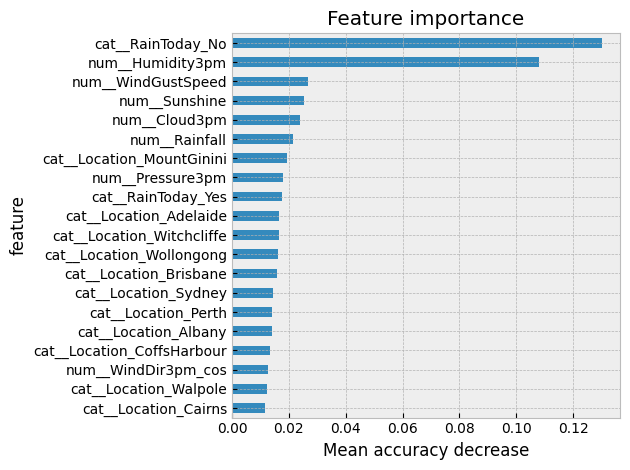

In [55]:
feature_names = importance_pipeline.named_steps["preprocess"].get_feature_names_out()

importance_df = pd.DataFrame({
    "feature": feature_names,
    "importance": importance_pipeline.named_steps["model"].feature_importances_
}).sort_values("importance", ascending=False)

display(importance_df.head(20))

plt.figure(figsize=(9, 6))
importance_df.head(20).sort_values("importance").plot(
    kind="barh",
    x="feature",
    y="importance",
    legend=False
)
plt.title("Feature importance")
plt.xlabel("Mean accuracy decrease")
plt.tight_layout()
plt.show()

## Final retraining on train + validation

In [56]:
final_model = grid_search.best_estimator_
final_model.fit(X_raw, y_raw)

print("Final model retrained on all training data.")

Final model retrained on all training data.


## Save the trained model

In [57]:
model_path = MODEL_DIR / "best_rain_model.joblib"
joblib.dump(final_model, model_path)

print(f"Saved model to: {model_path}")

Saved model to: models/best_rain_model.joblib


## Threshold tuning interpretation

In [58]:
test_ids = test_df["ID"].copy()

test_proba = final_model.predict_proba(test_df)[:, 1]

# Select the threshold on the validation set, then apply the same threshold to the test set.
threshold_df = threshold_search(y_valid_raw, valid_proba)
best_threshold = threshold_df.sort_values("f1", ascending=False).iloc[0]["threshold"]

print("Best threshold:", best_threshold)

valid_pred_tuned = (valid_proba >= best_threshold).astype(int)
print(classification_report(y_valid_raw, valid_pred_tuned))

test_pred = (test_proba >= best_threshold).astype(int)

submission_df = pd.DataFrame({
    "ID": test_ids,
    "RainTomorrow": test_pred
})

submission_path = OUTPUT_DIR / "submission.csv"
submission_df.to_csv(submission_path, index=False)

submission_proba_df = pd.DataFrame({
    "ID": test_ids,
    "RainTomorrow_proba": test_proba
})

submission_proba_df.to_csv(
    OUTPUT_DIR / "submission_proba.csv",
    index=False
)

display(submission_df.head())
print(f"Saved predictions to: {submission_path}")

metadata = {
    "best_threshold": float(best_threshold),
    "threshold_selection_metric": "f1",
    "validation_accuracy_at_threshold": float(accuracy_score(y_valid_raw, valid_pred_tuned)),
    "validation_precision_at_threshold": float(precision_score(y_valid_raw, valid_pred_tuned)),
    "validation_recall_at_threshold": float(recall_score(y_valid_raw, valid_pred_tuned)),
    "validation_f1_at_threshold": float(f1_score(y_valid_raw, valid_pred_tuned))
}

with open(OUTPUT_DIR / "model_metadata.json", "w") as f:
    json.dump(metadata, f, indent=2)

Best threshold: 0.35999999999999993
              precision    recall  f1-score   support

           0       0.91      0.91      0.91     17661
           1       0.68      0.69      0.69      5092

    accuracy                           0.86     22753
   macro avg       0.80      0.80      0.80     22753
weighted avg       0.86      0.86      0.86     22753



,ID,RainTomorrow
0,100722,1
1,30235,0
2,68428,1
3,28625,0
4,31174,1


Saved predictions to: outputs/submission.csv


In [59]:
if target_col in test_df.columns:
    y_test = test_df[target_col]

    test_metrics = {
        "accuracy": accuracy_score(y_test, test_pred),
        "balanced_accuracy": balanced_accuracy_score(y_test, test_pred),
        "precision": precision_score(y_test, test_pred, zero_division=0),
        "recall": recall_score(y_test, test_pred, zero_division=0),
        "f1": f1_score(y_test, test_pred, zero_division=0),
        "roc_auc": roc_auc_score(y_test, test_proba),
        "pr_auc": average_precision_score(y_test, test_proba)
    }

    display(pd.DataFrame([test_metrics]))

    cm = confusion_matrix(y_test, test_pred)
    ConfusionMatrixDisplay(cm, display_labels=[0, 1]).plot()
    plt.title("Final model - test confusion matrix")
    plt.show()
else:
    print("No test labels found. This is expected in a real interview setting.")

No test labels found. This is expected in a real interview setting.
